# Image analysis
---
Fourier analysis of noisy images -- images acquired with the beam blanked.
Comparisons are made to tissue images acquired with comparable settings.

In [1]:
from pathlib import Path
import re
from itertools import product

from tqdm.notebook import tqdm
import numpy as np
import scipy.signal as signal
from scipy.signal import medfilt
import pandas as pd
import seaborn as sns
import altair as alt
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

from skimage import img_as_float
from skimage.util import crop
from skimage.external import tifffile

In [2]:
# Add `azimuthal_average` module to path
import sys
fp = Path('M:/tnw/ist/do/projects/iCAT/development/Lane-optimization-2020/code/azimuthal_average.py')
if fp.parent.as_posix() not in sys.path:
    sys.path.insert(0, fp.parent.as_posix())

from azimuthal_average import *

## Sample of images
---

In [3]:
# Set filepath for DATA
DATA_dir = Path('../data/noise_images/')

# Select files and initialize DataFrame
df_noi = pd.DataFrame({'FP': list(DATA_dir.glob('*-mode/*.tif'))})

# Build up DataFrame
df_noi['MODE'] = df_noi['FP'].apply(lambda x: x.parent.name.split('-')[0])
df_noi['PE'] = df_noi['FP'].apply(lambda x: int(re.findall('\d+', x.stem)[0]))
df_noi['SB'] = df_noi['FP'].apply(lambda x: int(re.findall('\d+', x.stem)[1]))
df_noi['LE'] = df_noi['PE'] - df_noi['SB']
df_noi['NPIX'] = df_noi['FP'].apply(lambda x: int(re.findall('\d+', x.stem)[2]))
df_noi['DWELL'] = df_noi['FP'].apply(lambda x: int(re.findall('\d+', x.stem)[3]))

# Sort out 500ns dwell time
ids = df_noi.loc[df_noi['DWELL'] == 500].index
df_noi.loc[ids, 'DWELL'] = 0.5

# Preview
df_noi.sort_values(['MODE', 'SB', 'DWELL'], inplace=True)
df_noi.sample(5)

,FP,MODE,PE,SB,LE,NPIX,DWELL
36,..\data\noise_images\UHR-mode\3000V_500V-SB_10...,UHR,3000,500,2500,1024,1.0
16,..\data\noise_images\HR-mode\3000V_500V-SB_102...,HR,3000,500,2500,1024,1.0
21,..\data\noise_images\UHR-mode\3000V_0V-SB_1024...,UHR,3000,0,3000,1024,3.0
3,..\data\noise_images\HR-mode\3000V_0V-SB_1024x...,HR,3000,0,3000,1024,5.0
37,..\data\noise_images\UHR-mode\3000V_500V-SB_10...,UHR,3000,500,2500,1024,3.0


### HR-mode
#### Images

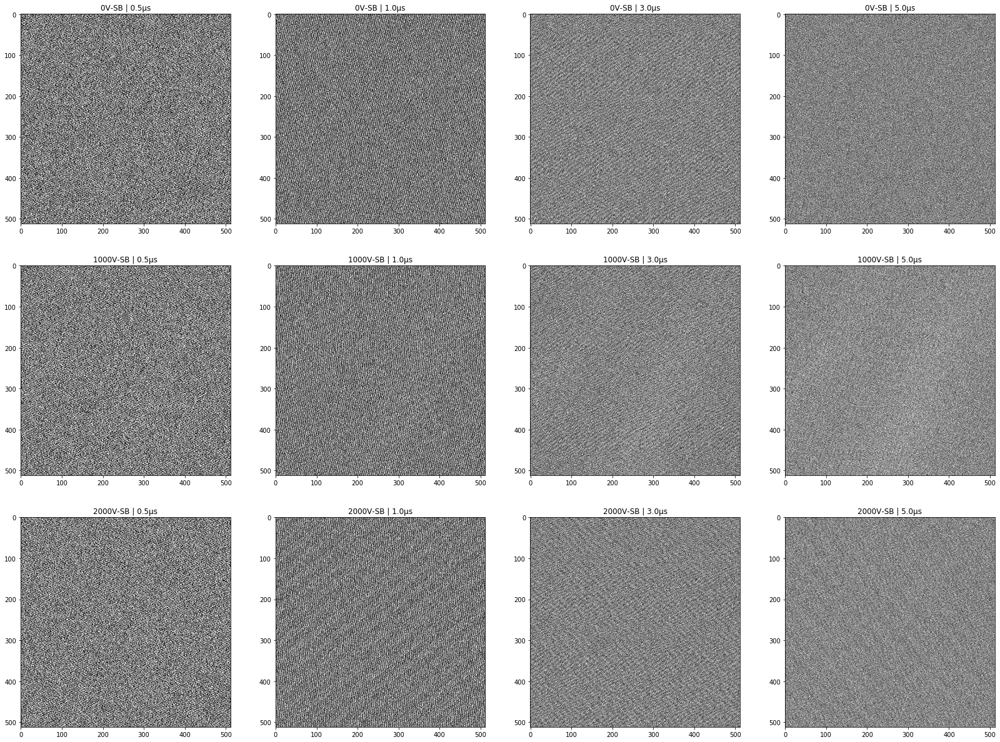

In [4]:
# Filter DataFrame
source = df_noi.loc[(df_noi['MODE'] == 'HR') &\
                    (df_noi['SB'].isin([0, 1000, 2000]))].copy()

# Make figure
ncols = source['DWELL'].unique().size
nrows = source['SB'].unique().size
fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                         figsize=(7*ncols, 7*nrows))
axmap = {k: v for k, v in zip(product(source['DWELL'].unique(),
                                      source['SB'].unique()), axes.T.flat)}

for (DWELL, SB), row in source.groupby(['DWELL', 'SB']):

    # Set axis
    ax = axmap[DWELL, SB]

    # Plot image
    image = tifffile.imread(row['FP'].iloc[0].as_posix())
    cropped = crop(image, crop_width=((100, 342), (256, 256)), copy=True)
    ax.imshow(cropped, cmap='Greys_r')

    # Axis aesthetics
    title = f"{SB}V-SB | {DWELL}µs"
    ax.set_title(title)

#### FFT's

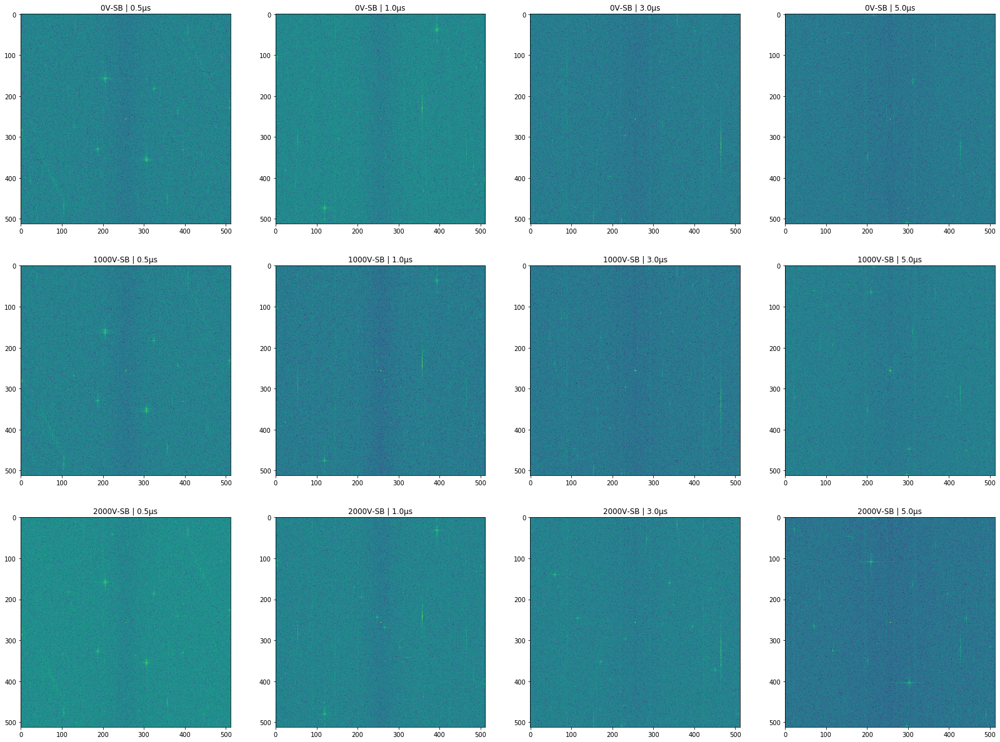

In [5]:
# Make figure
ncols = source['DWELL'].unique().size
nrows = source['SB'].unique().size
fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                         figsize=(7*ncols, 7*nrows))
axmap = {k: v for k, v in zip(product(source['DWELL'].unique(),
                                      source['SB'].unique()), axes.T.flat)}

for (DWELL, SB), row in source.groupby(['DWELL', 'SB']):

    # Set axis
    ax = axmap[DWELL, SB]

    # Plot image
    image = tifffile.imread(row['FP'].iloc[0].as_posix())
    cropped = crop(image, crop_width=((100, 342), (256, 256)), copy=True)
    FT_ = np.fft.fft2(cropped)
    FT = np.abs(np.fft.fftshift(FT_))
    ax.imshow(np.log(FT))

    # Axis aesthetics
    title = f"{SB}V-SB | {DWELL}µs"
    ax.set_title(title)

### UHR-mode

#### FFT's

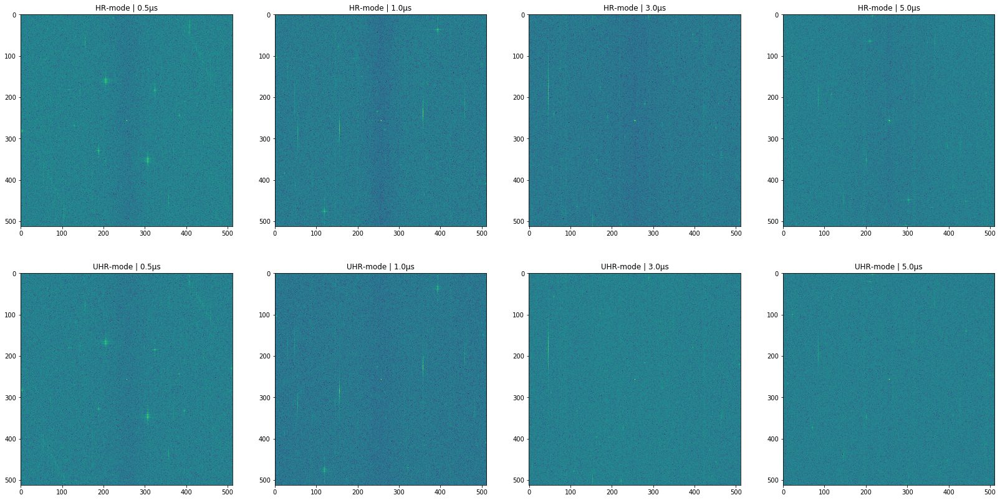

In [6]:
# Filter DataFrame
source = df_noi.loc[df_noi['SB'] == 1000].copy()

# Make figure
ncols = source['DWELL'].unique().size
nrows = source['MODE'].unique().size
fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                         figsize=(7*ncols, 7*nrows))
axmap = {k: v for k, v in zip(product(source['DWELL'].unique(),
                                      source['MODE'].unique()), axes.T.flat)}

for (DWELL, MODE), row in source.groupby(['DWELL', 'MODE']):

    # Set axis
    ax = axmap[DWELL, MODE]

    # Plot image
    image = tifffile.imread(row['FP'].iloc[0].as_posix())
    cropped = crop(image, crop_width=((100, 342), (256, 256)), copy=True)
    FT_ = np.fft.fft2(cropped)
    FT = np.abs(np.fft.fftshift(FT_))
    ax.imshow(np.log(FT))

    # Axis aesthetics
    title = f"{MODE}-mode | {DWELL}µs"
    ax.set_title(title)

#### Conclusion
CBS detector has same noise signature independent of imaging mode and stage bias.

## Fourier analysis
---

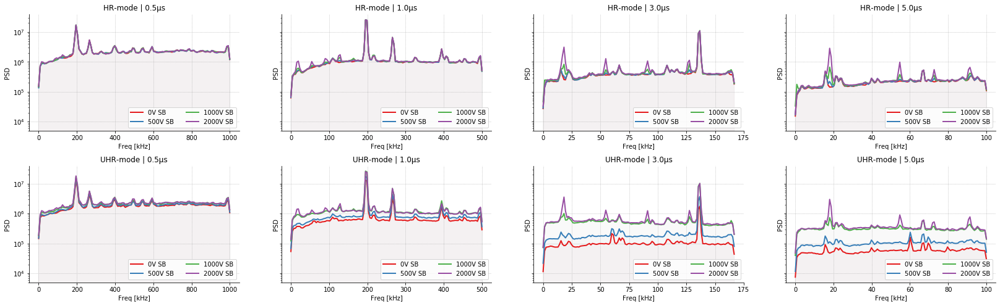

In [7]:
# Filter DataFrame
source = df_noi.loc[df_noi['SB'].isin([0, 500, 1000, 2000])].copy()

# Make figure (SB varies by column, MODE varies by row)
ncols = source['DWELL'].unique().size
nrows = source['MODE'].unique().size
fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                         sharex=False, sharey=True,
                         figsize=(7*ncols, 4*nrows))
plt.subplots_adjust(hspace=0.3)
axmap = {k: v for k, v in zip(product(source['DWELL'].unique(),
                                      source['MODE'].unique()), axes.T.flat)}
cmap = {k: v for k, v in zip(source['SB'].unique(),
                             sns.color_palette('Set1'))}

for (DWELL, MODE), sub in source.groupby(['DWELL', 'MODE']):

    # Set axis
    ax = axmap[DWELL, MODE]

    for i, row in sub.iterrows():

        # Plot image
        image = tifffile.imread(row['FP'].as_posix())
        cropped = crop(image, crop_width=((100, 342), (256, 256)), copy=True)
        fs = 1 / (row['DWELL'] * 1e-3)  # sampling frequency [kHz]
        f, Pwelch_spec = signal.welch(cropped.ravel(), fs=fs, scaling='spectrum')
        ax.plot(f, Pwelch_spec, color=cmap[row['SB']], lw=2, label=f"{row['SB']}V SB")
        ax.fill_between(f, 0, Pwelch_spec, color=cmap[row['SB']], alpha=0.02)

    # Axis aesthetics
    title = f"{MODE}-mode | {DWELL}µs"
    ax.set_title(title)
    ax.set_ylabel('PSD')
    ax.set_xlabel('Freq [kHz]')
    ax.set_yscale('log')
    ax.legend(loc=4, ncol=2)
    ax.grid(ls=':')
    sns.despine(ax=ax)

### Welch's method on bioimages

Do the images of biological material show the same noise signatures? First have to find and sort out the bioimages...

In [8]:
# Set filepath for DATA
DATA_dir = Path('../data/SNR_images/')

# Select files and initialize DataFrame
df_bio = pd.DataFrame({'FP': list(DATA_dir.glob('*-mode/*/*/*.tif'))})

# Build up DataFrame
df_bio['MODE'] = df_bio['FP'].apply(lambda x: x.parents[2].name.split('-')[0])
df_bio['LE'] = df_bio['FP'].apply(lambda x: int(re.findall('\d+', x.parents[1].name)[0]))
df_bio['SB'] = df_bio['FP'].apply(lambda x: int(re.findall('\d+', x.parents[1].name)[1]))
df_bio['FIELD'] = df_bio['FP'].apply(lambda x: int(re.findall('\d+', x.parents[0].name)[0]))
df_bio['DWELL'] = df_bio['FP'].apply(lambda x: int(re.findall('\d+', x.stem)[1]))

# Preview
df_bio.sort_values(['MODE', 'SB', 'DWELL'], inplace=True)
df_bio.sample(5)

,FP,MODE,LE,SB,FIELD,DWELL
164,..\data\SNR_images\HR-mode\1500eV-LE__3000V-SB...,HR,1500,3000,3,5
282,..\data\SNR_images\UHR-mode\1500eV-LE__1500V-S...,UHR,1500,1500,2,20
339,..\data\SNR_images\UHR-mode\1500eV-LE__200V-SB...,UHR,1500,200,3,5
26,..\data\SNR_images\HR-mode\1500eV-LE__1000V-SB...,HR,1500,1000,1,1
255,..\data\SNR_images\UHR-mode\1500eV-LE__100V-SB...,UHR,1500,100,2,10


#### Quick look at sample of the images

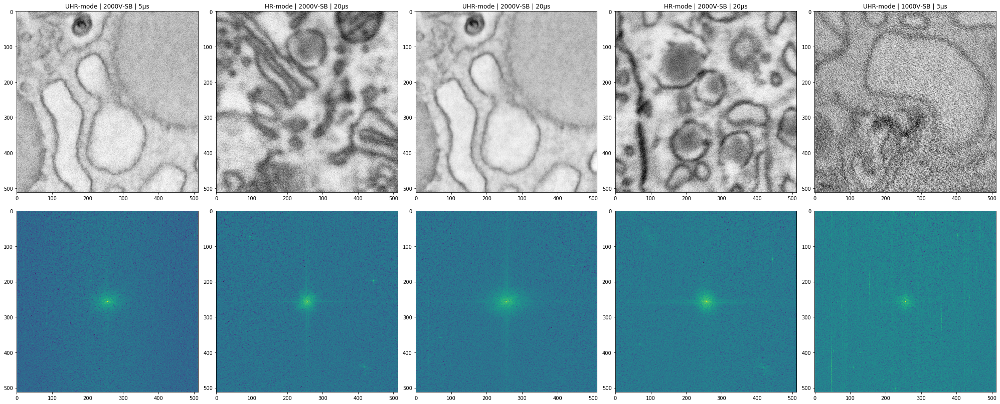

In [9]:
# Sample DataFrame
N_samples = 5
source = df_bio.loc[(df_bio['SB'].isin([0, 1000, 2000]))]\
               .sample(N_samples)\
               .copy()

# Make figure
fig, axes = plt.subplots(ncols=N_samples, nrows=2,
                         figsize=(7*N_samples, 7*2))
axmap = {k: v for k, v in zip(source.index, axes.T)}

for i, row in source.iterrows():

    # Plot image
    image = tifffile.imread(row['FP'].as_posix())
    crop_width = (((image.shape[0] - 512) // 2,) * 2,
                  ((image.shape[1] - 512) // 2,) * 2)
    cropped = crop(image, crop_width=crop_width, copy=True)
    axmap[i][0].imshow(cropped, cmap='Greys_r')

    # Compute and plot FFT
    FT_ = np.fft.fft2(cropped)
    FT = np.abs(np.fft.fftshift(FT_))
    axmap[i][1].imshow(np.log(FT))

    # Axis aesthetics
    title = f"{row['MODE']}-mode | {row['SB']}V-SB | {row['DWELL']}µs"
    axmap[i][0].set_title(title)

# Figure aesthetics
plt.subplots_adjust(hspace=0.1, wspace=0.1)

#### Azimuthally averaged PSD of bioimages

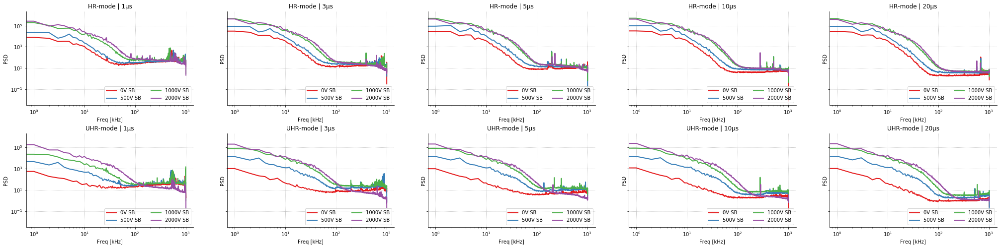

In [10]:
# Filter DataFrame
source = df_bio.loc[(df_bio['FIELD'] == 3) &\
                    (df_bio['SB'].isin([0, 500, 1000, 2000]))].copy()

# Make figure (SB varies by column, MODE varies by row)
ncols = source['DWELL'].unique().size
nrows = source['MODE'].unique().size
fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                         sharex=False, sharey=True,
                         figsize=(7*ncols, 4*nrows))
plt.subplots_adjust(hspace=0.3)
axmap = {k: v for k, v in zip(product(source['DWELL'].unique(),
                                      source['MODE'].unique()), axes.T.flat)}
cmap = {k: v for k, v in zip(source['SB'].unique(),
                             sns.color_palette('Set1', n_colors=source['SB'].unique().size))}

for (DWELL, MODE), sub in source.groupby(['DWELL', 'MODE']):

    # Set axis
    ax = axmap[DWELL, MODE]

    for i, row in sub.iterrows():

        # Read image
        image = tifffile.imread(row['FP'].as_posix())
        cropped = crop(image, crop_width=((100, 342), (256, 256)), copy=True)

        # Measure PSD
        fft = np.fft.fft2(cropped) / (np.multiply(*cropped.shape))
        fftnorm = np.abs(fft)**2
        PPaz, N = azimuthalAverage(fftnorm)
        # Measure noise floor
        floor = np.median(PPaz[int(len(PPaz)/1.4):])

        # Plot PSD
        ax.loglog(PPaz, color=cmap[row['SB']], lw=2, label=f"{row['SB']}V SB")
#         ax.axhline(floor, ls='--', color='k')

    # Axis aesthetics
    title = f"{MODE}-mode | {DWELL}µs"
    ax.set_title(title)
    ax.set_ylabel('PSD')
    ax.set_xlabel('Freq [kHz]')
    ax.set_yscale('log')
    ax.legend(loc=4, ncol=2)
    ax.grid(ls=':')
    sns.despine(ax=ax)

## Comparing bioimages vs noise images
---
Ok now it's time to put some of this stuff together. So let's plot the spectra of bioimages on top of the corresponding noise images. But first let's compare the 2D FFT's.

### 2D FFT comparison

Choose a random bioimage that has a correspondoing noise image (note that landing energies will probably not match, but that's probably fine since LE shouldn't play a role in the noise image).

In [11]:
# Choose a random bioimage (that has a correspondoing noise image)
el_bio = df_bio.loc[(df_bio['SB'].isin(df_noi['SB'].unique())) &\
                    (df_bio['DWELL'].isin(df_noi['DWELL'].unique()))]\
               .sample(1).iloc[0]

# Corresponding noise image (element)
el_noi = df_noi.loc[(df_noi['MODE'] == el_bio['MODE']) &\
                    (df_noi['SB'] == el_bio['SB']) &\
                    (df_noi['DWELL'] == el_bio['DWELL'])].iloc[0]

# Combine elements into DataFrame
source = pd.DataFrame([el_bio, el_noi])
source

,FP,MODE,LE,SB,FIELD,DWELL,PE,NPIX
244,..\data\SNR_images\UHR-mode\1500eV-LE__1000V-S...,UHR,1500,1000,4.0,5.0,NaN,NaN
27,..\data\noise_images\UHR-mode\3000V_1000V-SB_1...,UHR,2000,1000,NaN,5.0,3000.0,1024.0


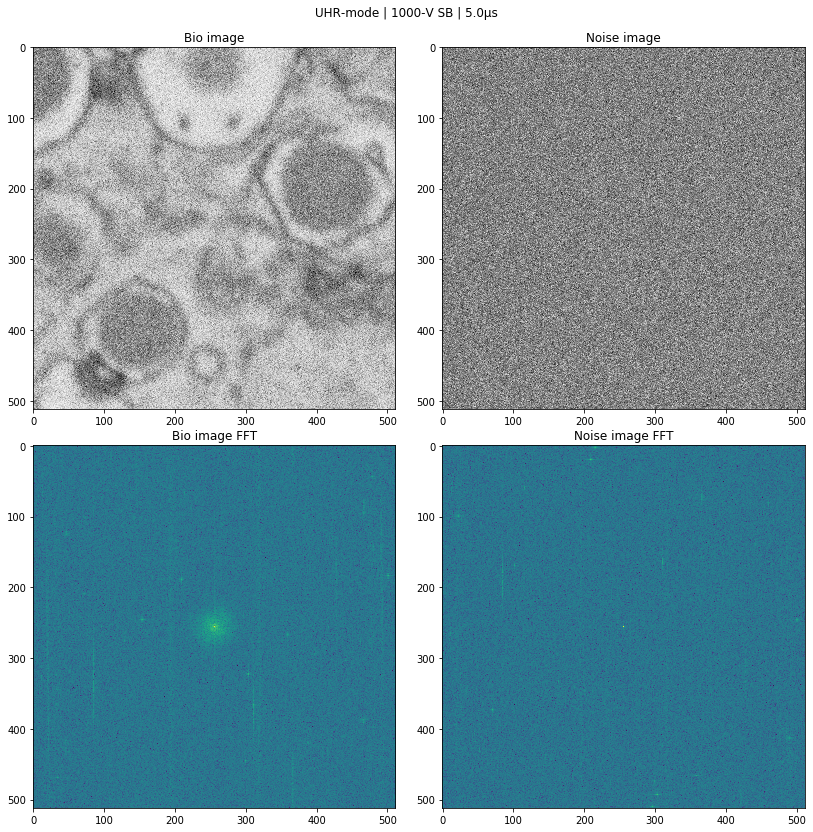

In [12]:
# Make figure
ncols = len(source)
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                         figsize=(7*ncols, 7*nrows))
axmap = {k: v for k, v in zip(source.index, axes.T)}

for i, row in source.iterrows():

    # Plot image
    image = tifffile.imread(row['FP'].as_posix())
    crop_width = (((image.shape[0] - 512) // 2,) * 2,
                  ((image.shape[1] - 512) // 2,) * 2)
    cropped = crop(image, crop_width=crop_width, copy=True)
    axmap[i][0].imshow(cropped, cmap='Greys_r')

    # Compute and plot FFT
    FT_ = np.fft.fft2(cropped)
    FT = np.abs(np.fft.fftshift(FT_))
    axmap[i][1].imshow(np.log(FT))

    # Axis aesthetics
    axes[0, 0].set_title("Bio image")
    axes[0, 1].set_title("Noise image")
    axes[1, 0].set_title("Bio image FFT")
    axes[1, 1].set_title("Noise image FFT")

# Figure aesthetics
title = f"{row['MODE']}-mode | {row['SB']}-V SB | {row['DWELL']}µs"
fig.suptitle(title, y=0.92)
plt.subplots_adjust(hspace=0.1, wspace=0.1)

### PSD comparison

So definitely not a conclusive match from looking at the FFTs. Data was taken months apart though so maybe an exact match shouldn't be expected. But maybe they have the same (1D) frequency spikes? So let's compare the PSDs...

In [13]:
# Merge noise and bioimage DataFrames
df_noi['SOURCE'] = 'NOISE'
df_bio['SOURCE'] = 'BIO'
df_mrg = pd.concat([df_noi, df_bio], sort=False)

df_mrg.groupby('SOURCE')\
      .apply(lambda x: x.sample(3))

FP MODE      PE  \
SOURCE                                                                       
BIO    81   ..\data\SNR_images\HR-mode\1500eV-LE__1500V-SB...   HR     NaN   
       0    ..\data\SNR_images\HR-mode\1500eV-LE__0V-SB\fi...   HR     NaN   
       355  ..\data\SNR_images\UHR-mode\1500eV-LE__3000V-S...  UHR     NaN   
NOISE  7    ..\data\noise_images\HR-mode\3000V_1000V-SB_10...   HR  3000.0   
       34   ..\data\noise_images\UHR-mode\3000V_2000V-SB_1...  UHR  3000.0   
       2    ..\data\noise_images\HR-mode\3000V_0V-SB_1024x...   HR  3000.0   

              SB    LE    NPIX  DWELL SOURCE  FIELD  
SOURCE                                               
BIO    81   1500  1500     NaN    1.0    BIO    2.0  
       0       0  1500     NaN   10.0    BIO    1.0  
       355  3000  1500     NaN   10.0    BIO    2.0  
NOISE  7    1000  2000  1024.0    5.0  NOISE    NaN  
       34   2000  1000  1024.0    0.5  NOISE    NaN  
       2       0  3000  1024.0    0.5  NOISE    NaN

#### HR-mode

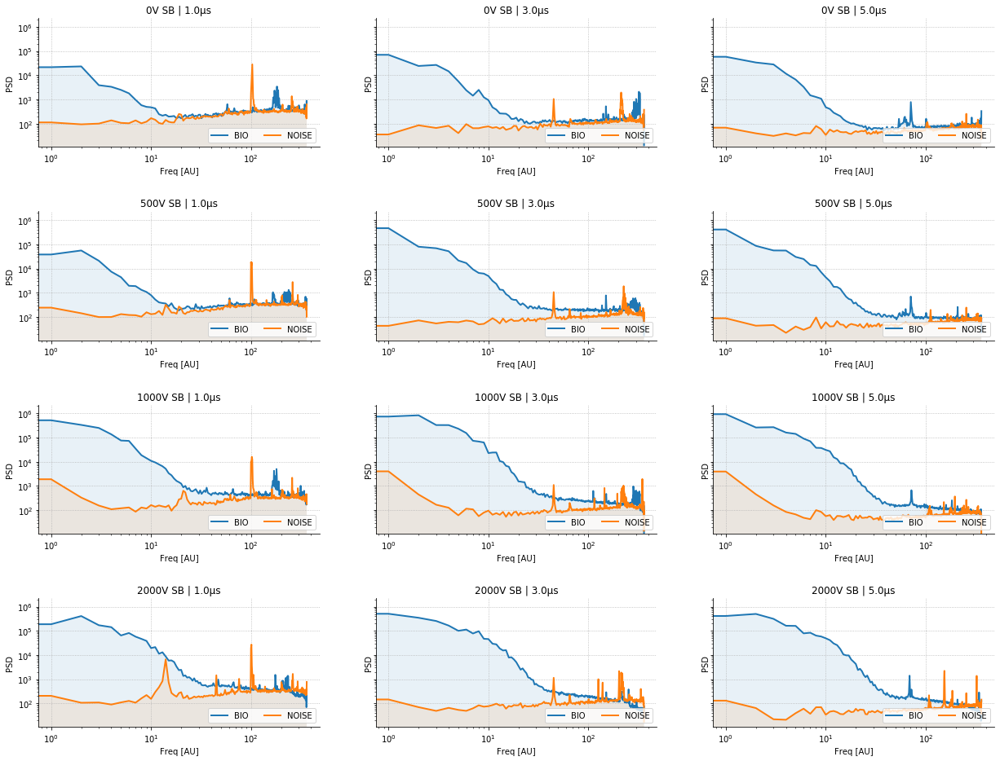

In [14]:
# Filter DataFrame
source = df_mrg.loc[(df_mrg['MODE'] == 'HR') &\
                    (df_mrg['SB'].isin([0, 500, 1000, 2000])) &\
                    (df_mrg['DWELL'].isin([1, 3, 5]))].copy()

# Make figure (SB varies by row, DWELL varies by col)
ncols = source['DWELL'].unique().size
nrows = source['SB'].unique().size
fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                         sharex=False, sharey=True,
                         figsize=(7*ncols, 4*nrows))
plt.subplots_adjust(hspace=0.5)
axmap = {k: v for k, v in zip(product(source['DWELL'].unique(),
                                      source['SB'].unique()), axes.T.flat)}

# Loop through noise and bioimage pairs
for (DWELL, SB), grp in source.groupby(['DWELL', 'SB']):

    # Set axis
    ax = axmap[DWELL, SB]

    # Choose just one bioimage (and corresponding noise image)
    for i, row in grp.groupby(['SOURCE']).apply(lambda x: x.sample(1)).iterrows():

        # Read image
        image = tifffile.imread(row['FP'].as_posix())
        crop_width = (((image.shape[0] - 512) // 2,) * 2,
                      ((image.shape[1] - 512) // 2,) * 2)
        cropped = crop(image, crop_width=crop_width, copy=True)

        # Measure PSD
        fft = np.fft.fft2(cropped) / (np.multiply(*cropped.shape))
        fftnorm = np.abs(fft)**2
        PPaz, N = azimuthalAverage(fftnorm)
        # Measure noise floor
        floor = np.median(PPaz[int(len(PPaz)/1.4):])

        # Plot PSD
        ax.plot(PPaz, lw=2, label=f"{row['SOURCE']}")
        ax.fill_between(np.arange(PPaz.size), 0, PPaz, alpha=0.1)
#         ax.axhline(floor, ls='--', color='k')

    # Axis aesthetics
    title = f"{SB}V SB | {DWELL}µs"
    ax.set_title(title)
    ax.set_ylabel('PSD')
    ax.set_xlabel('Freq [AU]')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.legend(loc=4, ncol=2)
    ax.grid(ls=':')
    sns.despine(ax=ax)

#### UHR-mode

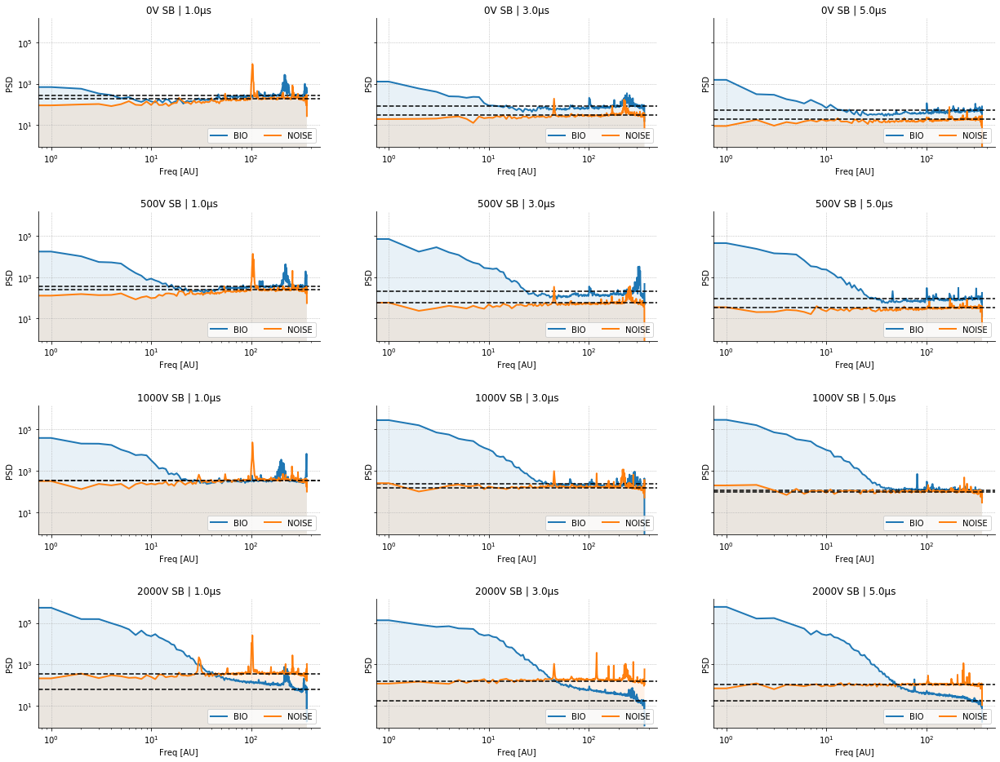

In [15]:
# Filter DataFrame
source = df_mrg.loc[(df_mrg['MODE'] == 'UHR') &\
                    (df_mrg['SB'].isin([0, 500, 1000, 2000])) &\
                    (df_mrg['DWELL'].isin([1, 3, 5]))].copy()

# Make figure (SB varies by row, DWELL varies by col)
ncols = source['DWELL'].unique().size
nrows = source['SB'].unique().size
fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                         sharex=False, sharey=True,
                         figsize=(7*ncols, 4*nrows))
plt.subplots_adjust(hspace=0.5)
axmap = {k: v for k, v in zip(product(source['DWELL'].unique(),
                                      source['SB'].unique()), axes.T.flat)}

# Loop through noise and bioimage pairs
for (DWELL, SB), grp in source.groupby(['DWELL', 'SB']):

    # Set axis
    ax = axmap[DWELL, SB]

    # Choose just one bioimage (and corresponding noise image)
    for i, row in grp.groupby(['SOURCE']).apply(lambda x: x.sample(1)).iterrows():

        # Read image
        image = tifffile.imread(row['FP'].as_posix())
        crop_width = (((image.shape[0] - 512) // 2,) * 2,
                      ((image.shape[1] - 512) // 2,) * 2)
        cropped = crop(image, crop_width=crop_width, copy=True)

        # Measure PSD
        fft = np.fft.fft2(cropped) / (np.multiply(*cropped.shape))
        fftnorm = np.abs(fft)**2
        PPaz, N = azimuthalAverage(fftnorm)
        # Measure noise floor
        floor = np.median(PPaz[int(len(PPaz)/1.4):])

        # Plot PSD
        ax.plot(PPaz, lw=2, label=f"{row['SOURCE']}")
        ax.fill_between(np.arange(PPaz.size), 0, PPaz, alpha=0.1)
        ax.axhline(floor, ls='--', color='k')

    # Axis aesthetics
    title = f"{SB}V SB | {DWELL}µs"
    ax.set_title(title)
    ax.set_ylabel('PSD')
    ax.set_xlabel('Freq [AU]')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.legend(loc=4, ncol=2)
    ax.grid(ls=':')
    sns.despine(ax=ax)
# plt.savefig('./plots/noise-floor_estimate.png', dpi=92)

#### Conclusion
Very different results compared to Welch's method. Peaks don't match up.

## SNR measurements
---
So now it's time to redo some SNR measurements. Let's first get the results found previously on the bioimages using the Joy method.

In [16]:
# Load SNR data
fp = Path('../data/SNR_measurements.csv')
df_JOY = pd.read_csv(fp)

# Preview
df_JOY.loc[(df_JOY['SB'].isin([0, 500, 1000, 2000]))]\
      .groupby(['MODE', 'SB'])\
      .apply(lambda x: x.sample(1))

MODE      LE      SB      PE  HFW        PS  DWELL       SNR  \
MODE SB                                                                        
HR   0.0    0     HR  1500.0     0.0  1500.0  4.0  0.001953    1.0 -0.083242   
     500.0  78    HR  1500.0   500.0  2000.0  4.0  0.001953    1.0 -0.044018   
     1000.0 113   HR  1500.0  1000.0  2500.0  4.0  0.001953    5.0  2.906775   
     2000.0 160   HR  1500.0  2000.0  3500.0  4.0  0.001953    5.0  3.264503   
UHR  0.0    211  UHR  1500.0     0.0  1500.0  4.0  0.001953    5.0  0.042874   
     500.0  288  UHR  1500.0   500.0  2000.0  4.0  0.001953    5.0  0.130850   
     1000.0 311  UHR  1500.0  1000.0  2500.0  4.0  0.001953    5.0  0.642582   
     2000.0 358  UHR  1500.0  2000.0  3500.0  4.0  0.001953    3.0  3.832829   

                      CNR                                                 FP  
MODE SB                                                                       
HR   0.0    0    0.293181  D:\rlane\Data\analysis\stage-bias\DATA\HR-mode...  
     500.0  78   0.337695  D:\rlane\Data\analysis\stage-bias\DATA\HR-mode...  
     1000.0 113  0.340732  D:\rlane\Data\analysis\stage-bias\DATA\HR-mode...  
     2000.0 160  0.287515  D:\rlane\Data\analysis\stage-bias\DATA\HR-mode...  
UHR  0.0    211  0.310385  D:\rlane\Data\analysis\stage-bias\DATA\UHR-mod...  
     500.0  288  0.211384  D:\rlane\Data\analysis\stage-bias\DATA\UHR-mod...  
     1000.0 311  0.256061  D:\rlane\Data\analysis\stage-bias\DATA\UHR-mod...  
     2000.0 358  0.269606  D:\rlane\Data\analysis\stage-bias\DATA\UHR-mod...

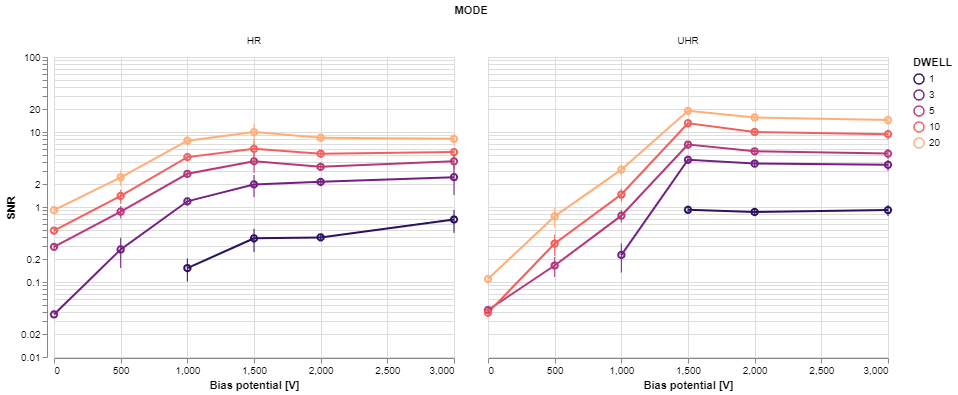

In [17]:
# Data source for plot
source = df_JOY.loc[(df_JOY['SNR'] > 0.02) &\
                    (~df_JOY['SB'].isin([100, 200]))].drop('FP', axis=1).copy()
# source['SB'] *= -1
scheme = 'magma'

chart = alt.Chart().encode(
    x=alt.X('SB:Q',
            axis=alt.Axis(tickMinStep=500,
                          title='Bias potential [V]')),
    y=alt.Y('SNR:Q',
            aggregate='mean',
            scale=alt.Scale(type='log')),
    color=alt.Color('DWELL:N',
                    scale=alt.Scale(scheme=scheme))
)

chart = (chart.mark_line() +\
         chart.mark_point(size=40))

error_bars = alt.Chart(source).mark_errorbar(extent='stdev').encode(
    x=alt.X('SB:Q'),
    y=alt.Y('SNR:Q'),
    color=alt.Color('DWELL:N',
                    scale=alt.Scale(scheme=scheme))
)

alt.layer(chart, error_bars, data=source).facet(
    column='MODE:N'
)

Now we'll calculate SNR via Luc's method. Part of Luc's method involves setting a cuttoff frequency below which the spectrum is considered signal and above which is considered noise. I think it makes sense to use the PSD of the noise images to choose the cutoff frequency (will be a bit arbitrary no matter what I think).

SNR metric is then calculated as the square root of the sum of all power in the signal divided by the sum of all power in the noise.

#### Make SNR calculation

Luc's PSD method for SNR

* Signal is sum of PSD
* Noise is sum of PSD at high frequencies with noise floor extrapolated to low frequencies
* SNR is signal divided by noise

\begin{equation}
SNR = \frac{\sigma_{signal}^2}{\sigma_{shot}^2 + \sigma_{detector}^2}
\end{equation}

In [18]:
# Initialize DataFrame for SNR
df_LUC = pd.DataFrame(columns=['MODE', 'SB', 'DWELL', 'SNR'])

# Filter DataFrame
source = df_bio.loc[(df_bio['SB'].isin([0, 500, 1000, 1500, 2000, 3000]))].copy()

# Loop through bioimages
for i, row in tqdm(source.iterrows(),
                   total=len(source)):

    # Compute and plot PSD
    image = tifffile.imread(row['FP'].as_posix())
    crop_width = (((image.shape[0] - 512) // 2,) * 2,
                  ((image.shape[1] - 512) // 2,) * 2)
    cropped = crop(image, crop_width=crop_width, copy=True)

    # Take FFT
    fft = np.fft.fft2(cropped) / (np.multiply(*cropped.shape))
    fftnorm = np.abs(fft)**2

    # Take azimuthal average of FFT
    PPaz, N = azimuthalAverage(fftnorm)
    # Measure noise floor
    floor = np.median(PPaz[int(len(PPaz)/1.4):])

    # Measure variances and SNR
    var_noise = np.sum(floor * N)
    var_total = np.sum(PPaz * N)  # == im.var()
    var_signal = var_total - var_noise
#     SNR = np.sqrt(var_signal / var_noise)
    SNR = var_signal / var_noise

    # Populate DataFrame
    df_LUC.loc[i, 'MODE'] = row['MODE']
    df_LUC.loc[i, 'SB'] = row['SB']
    df_LUC.loc[i, 'DWELL'] = row['DWELL']
    df_LUC.loc[i, 'SNR'] = SNR

# Preview
df_LUC = df_LUC.infer_objects()
df_LUC.groupby('MODE')\
      .apply(lambda x: x.head(3))

MODE  SB  DWELL       SNR
MODE                              
HR   1     HR   0      1  0.330863
     6     HR   0      1  0.330955
     11    HR   0      1  0.339863
UHR  201  UHR   0      1  0.401966
     206  UHR   0      1  0.390998
     211  UHR   0      1  0.360355

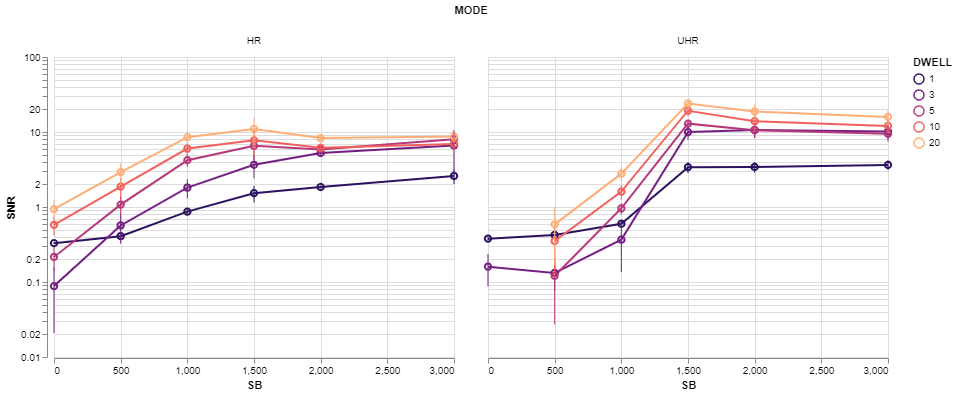

In [19]:
# Data source for plot
source = df_LUC.loc[df_LUC['SNR'] > 0].copy()

scheme = 'magma'

chart = alt.Chart().encode(
    x=alt.X('SB:Q',
            axis=alt.Axis(tickMinStep=500)),
    y=alt.Y('SNR:Q',
            aggregate='mean',
            scale=alt.Scale(type='log')),
    color=alt.Color('DWELL:N',
                    scale=alt.Scale(scheme=scheme)),
)

chart = (chart.mark_line() +\
         chart.mark_point(size=40))

error_bars = alt.Chart(source).mark_errorbar(extent='stdev').encode(
    x=alt.X('SB:Q'),
    y=alt.Y('SNR:Q'),
    color=alt.Color('DWELL:N',
                    scale=alt.Scale(scheme=scheme))
)

alt.layer(chart, error_bars, data=source).facet(
    column='MODE:N'
)

#### Compare methods

In [20]:
df_JOY['METHOD'] = 'JOY'
df_LUC['METHOD'] = 'PSD Luc'

df_SNR = pd.concat([df_JOY, df_LUC], join='inner', sort=False).infer_objects()
df_SNR.groupby('METHOD')\
      .apply(lambda x: x.sample(5))

MODE      SB  DWELL        SNR   METHOD
METHOD                                             
JOY     209  UHR     0.0    3.0  -0.081737      JOY
        266  UHR   200.0   10.0   0.523837      JOY
        383  UHR  3000.0    3.0   4.310504      JOY
        198   HR  3000.0   20.0   8.061745      JOY
        298  UHR   500.0   20.0   0.590341      JOY
PSD Luc 86    HR  1500.0    1.0   1.536708  PSD Luc
        357  UHR  3000.0   20.0  15.788867  PSD Luc
        98    HR  1500.0    3.0   5.637878  PSD Luc
        392  UHR   500.0   20.0   0.190779  PSD Luc
        306  UHR  2000.0    1.0   2.926665  PSD Luc

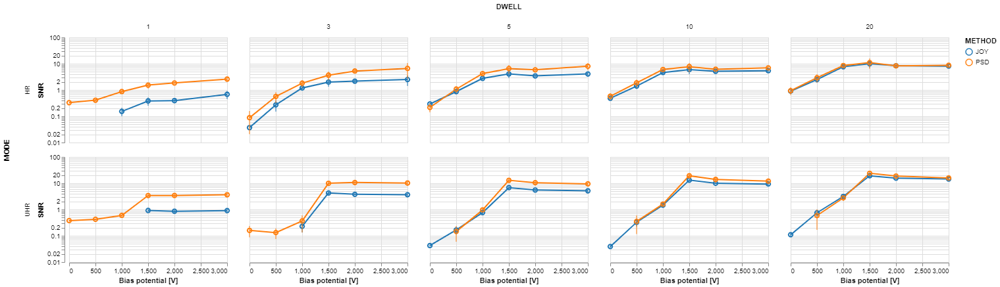

In [21]:
# Data source for plot
source = df_SNR.loc[(df_SNR['SNR'] > 0.02) &\
                    (df_SNR['SB'].isin(df_LUC['SB'].unique()))].copy()
source.loc[source['METHOD'] == 'PSD Luc', 'METHOD'] = 'PSD'
# source['SNR'] = np.sqrt(source['SNR'])
scheme = 'category10'

chart = alt.Chart().encode(
    x=alt.X('SB:Q',
            axis=alt.Axis(title='Bias potential [V]',
                          tickMinStep=500)),
    y=alt.Y('SNR:Q',
            aggregate='mean',
            scale=alt.Scale(type='log')),
    color=alt.Color('METHOD:N',
                    scale=alt.Scale(scheme=scheme))
).properties(
    width=240,
    height=160
)

chart = (chart.mark_line() +\
         chart.mark_point(size=40))

error_bars = alt.Chart(source).mark_errorbar(extent='stdev').encode(
    x=alt.X('SB:Q'),
    y=alt.Y('SNR:Q'),
    color=alt.Color('METHOD:N',
                    scale=alt.Scale(scheme=scheme))
)

alt.layer(chart, error_bars, data=source).facet(
    column='DWELL:N',
    row='MODE:N'
)

#### Validate methods

In [26]:
# Data source for calculation
source = df_SNR.loc[(df_SNR['SNR'] > 0.02) &\
                    (df_SNR['SB'].isin(df_LUC['SB'].unique()))]\
               .groupby(['METHOD', 'MODE', 'SB', 'DWELL'])\
               .mean()\
               .pivot_table('SNR', ['DWELL'], ['METHOD', 'MODE', 'SB']).T\
               .reset_index()

source.groupby('METHOD')\
      .apply(lambda x: x.head(3))

DWELL        METHOD MODE      SB       1.0       3.0       5.0      10.0  \
METHOD                                                                     
JOY     0       JOY   HR     0.0       NaN  0.036937  0.293758  0.485098   
        1       JOY   HR   500.0       NaN  0.271403  0.866172  1.404978   
        2       JOY   HR  1000.0  0.153389  1.187852  2.771469  4.627899   
PSD Luc 12  PSD Luc   HR     0.0  0.329732  0.088170  0.215624  0.577765   
        13  PSD Luc   HR   500.0  0.408082  0.567425  1.075909  1.868059   
        14  PSD Luc   HR  1000.0  0.868007  1.816308  4.206935  6.022209   

DWELL           20.0  
METHOD                
JOY     0   0.906027  
        1   2.487803  
        2   7.670678  
PSD Luc 12  0.939843  
        13  2.910911  
        14  8.515104

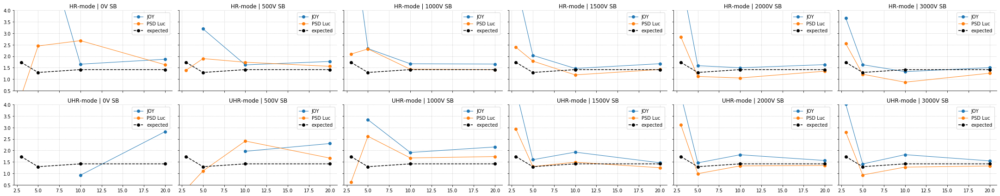

In [27]:
# Make figure
ncols = source['SB'].unique().size
nrows = source['MODE'].unique().size
fig, axes = plt.subplots(ncols=ncols, nrows=nrows,
                         sharex=True, sharey=True,
                         figsize=(5*ncols, 3*nrows))
axmap = {k: v for k, v in zip(product(source['SB'].unique(),
                                      source['MODE'].unique()), axes.T.flat)}
plt.subplots_adjust(hspace=0.4)

# Expected increase in SNR
dwells = df_SNR['DWELL'].unique()  # [1, 3, 5, 10, 20]
expected = np.sqrt(df_SNR['DWELL'].unique()[1:] /
                   df_SNR['DWELL'].unique()[:-1])  # [3, 1.67, 2, 2]

for (METHOD, MODE, SB), grp in source.groupby(['METHOD', 'MODE', 'SB']):

    # Set axis
    ax = axmap[SB, MODE]

    # Plot relative increase in SNR
    SNRs = grp[dwells].dropna(axis=1).values.flatten()
    dwells_ = grp[dwells].dropna(axis=1).columns.values.astype(float)
    rel_incr = SNRs[1:] / SNRs[:-1]
    ax.plot(dwells_[1:], rel_incr, 'o-', lw=1, label=f'{METHOD}')
    # Only plot expected increase once
    if METHOD == 'PSD Luc':
        ax.plot(dwells[1:], expected, 'ko--', lw=1.5, label='expected')

    # Axis aesthetics
    title = f'{MODE}-mode | {SB:.0f}V SB'
    ax.set_title(title)
    ax.set_ylim(0.5, 4)
    ax.legend(loc=1)
    ax.grid(ls=':')
    sns.despine(ax=ax)
plt.tight_layout()

## High noise vs low noise PSD comparison
---

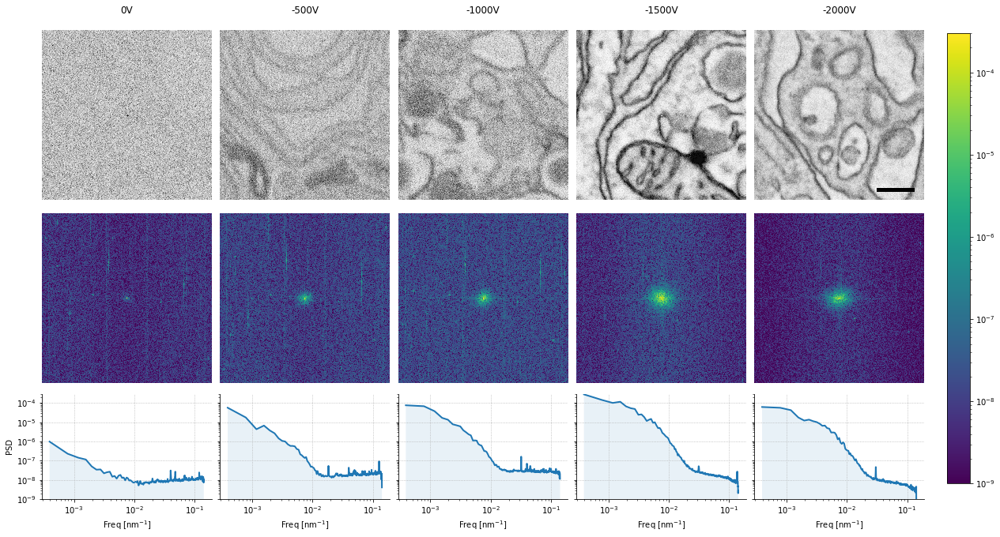

In [24]:
# Sample DataFrame
MODE = 'UHR'
LE = 1500
DWELL = 5
FIELD = 3
SBs = [0, 500, 1000, 1500, 2000]
source = df_bio.loc[(df_bio['MODE'] == MODE) &\
                    (df_bio['LE'] == LE) &\
                    (df_bio['DWELL'] == DWELL) &\
                    (df_bio['FIELD'] == FIELD) &\
                    (df_bio['SB'].isin(SBs))]\
               .copy()

# Make figure
fig, axes = plt.subplots(ncols=len(source), nrows=3,
                         figsize=(4*len(source), 11),
                         gridspec_kw={'height_ratios': [5, 5, 3]})
axmap = {k: v for k, v in zip(source.index, axes.T)}


for i, row in tqdm(source.iterrows(),
                   total=len(source)):

    # Plot image
    image = tifffile.imread(row['FP'].as_posix())
    crop_width = (((image.shape[0] - 512) // 2,) * 2,
                  ((image.shape[1] - 512) // 2,) * 2)
    cropped = img_as_float(crop(image, crop_width=crop_width, copy=True))
    axmap[i][0].imshow(cropped, cmap='Greys_r', zorder=0)
    if row['SB'] == 2000:
        axmap[i][0].axhline(480, 0.73, 0.93, color='k', lw=5, zorder=10)  # 500nm scale bar

    # Compute and plot FFT
    fft = np.fft.fft2(cropped) / (np.multiply(*cropped.shape))
    fftnorm = np.abs(fft)**2
    vmin, vmax = (1e-9,  # ~ np.median(np.sort(fftnorm.flat)[:500]),
                  3e-4)  # ~ np.sort(fftnorm.flat)[-2])
    im = axmap[i][1].imshow(np.fft.fftshift(fftnorm), norm=LogNorm(), vmin=vmin, vmax=vmax)

    # Measure PSD
    PPaz, N = azimuthalAverage(fftnorm)
    # Measure noise floor
    floor = np.median(PPaz[int(len(PPaz)/1.4):])
    # Calculate frequency
    ps = 5  # pixel size (nm/px)
    N = cropped.shape[0]  # "number of pixels in one direction"
    freq = (np.arange(PPaz.size)+1) / (ps * N)

    # Plot PSD
    axmap[i][2].plot(freq, PPaz, lw=2, label=f"{row['SOURCE']}")
    axmap[i][2].fill_between(freq, 0, PPaz, alpha=0.1)

    # Axis aesthetics
    title = f"{-row['SB']}V"
    axmap[i][0].set_title(title, y=1.07)
    axmap[i][0].axis('off')
    axmap[i][1].axis('off')
    axmap[i][2].set_xlabel('Freq [nm$^{-1}$]')
    axmap[i][2].set_ylim(vmin, vmax)
    axmap[i][2].set_xscale('log')
    axmap[i][2].set_yscale('log')
    axmap[i][2].grid(ls=':')
    sns.despine(ax=axmap[i][2])
    if row['SB'] == 0:
        axmap[i][2].set_ylabel('PSD')
    else:
        axmap[i][2].set_yticklabels([])

# Figure aesthetics
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.72])
cbar = fig.colorbar(im, cax=cbar_ax)
plt.subplots_adjust(hspace=0.05, wspace=0.05)